***Testing different variables***

This is how it is done

In [1]:
install.packages("GGally")
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(dplyr)

also installing the dependency ‘ggstats’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



In [2]:
library(car)
install.packages("sandwich")
library(sandwich)

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [3]:
install.packages("MASS")
library(MASS)

Warning message:
“package ‘MASS’ is not available for this version of R
‘MASS’ version 7.3-61 is in the repositories but depends on R (>= 4.4.0)
‘MASS’ version 7.3-61 is in the repositories but depends on R (>= 4.5)

A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages”

Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select




In [4]:
cancer_data <- read.csv("US_county_cancer_data.csv")
head(cancer_data)

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,⋯,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
,<dbl>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1397,469,164.9,489.8,61898,260131,11.2,499.74820,"(61494.5, 125635]",39.3,⋯,NA,41.6,32.9,14.0,81.78053,2.5947283,4.8218571,1.8434785,52.85608,6.118831
2,173,70,161.3,411.6,48127,43269,18.6,23.11123,"(48021.6, 51046.4]",33.0,⋯,53.8,43.6,31.1,15.3,89.22851,0.9691025,2.2462326,3.7413515,45.37250,4.333096
3,102,50,174.7,349.7,49348,21026,14.6,47.56016,"(48021.6, 51046.4]",45.0,⋯,43.5,34.9,42.1,21.1,90.92219,0.7396734,0.4658982,2.7473583,54.44487,3.729488
4,427,202,194.8,430.4,44243,75882,17.1,342.63725,"(42724.4, 45201]",42.8,⋯,40.3,35.0,45.3,25.0,91.74469,0.7826260,1.1613587,1.3626432,51.02151,4.603841
5,57,26,144.4,350.1,49955,10321,12.5,0.00000,"(48021.6, 51046.4]",48.3,⋯,43.9,35.1,44.0,22.7,94.10402,0.2701920,0.6658304,0.4921355,54.02746,6.796657
6,428,152,176.0,505.4,52313,61023,15.6,180.25990,"(51046.4, 54545.6]",45.4,⋯,38.8,32.6,43.2,20.2,84.88263,1.6532052,1.5380566,3.3146354,51.22036,4.964476


***ORIGINAL MODEL***

In [12]:
cleaned_data <- dplyr::select(cancer_data, medIncome, povertyPercent, PctPrivateCoverage, PctPublicCoverage, PctEmpPrivCoverage)

In [13]:
cleaned_data <- cleaned_data |>
  mutate(across(everything(), as.numeric))

In [20]:
base_model <- lm(TARGET_deathRate ~ medIncome + povertyPercent + PctPrivateCoverage + PctPublicCoverage, data = cancer_data)
summary(base_model)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent + 
    PctPrivateCoverage + PctPublicCoverage, data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-119.288  -13.455    1.064   14.829  175.064 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         1.503e+02  1.025e+01  14.661  < 2e-16 ***
medIncome          -3.123e-04  7.032e-05  -4.442 9.25e-06 ***
povertyPercent      1.014e+00  1.414e-01   7.167 9.61e-13 ***
PctPrivateCoverage  6.769e-02  8.134e-02   0.832    0.405    
PctPublicCoverage   5.965e-01  9.441e-02   6.318 3.03e-10 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.58 on 3042 degrees of freedom
Multiple R-squared:  0.2168,	Adjusted R-squared:  0.2157 
F-statistic: 210.5 on 4 and 3042 DF,  p-value: < 2.2e-16


***PctPrivateCoverage has no statistical significance, we can get rid of it entirely***

In [77]:
base_model_alt <- lm(TARGET_deathRate ~ medIncome + povertyPercent + PctPublicCoverage, data = cancer_data)
summary(base_model_alt)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent + 
    PctPublicCoverage, data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-120.929  -13.556    1.249   14.851  175.241 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        1.569e+02  6.456e+00  24.303  < 2e-16 ***
medIncome         -3.128e-04  7.032e-05  -4.448 8.98e-06 ***
povertyPercent     9.441e-01  1.142e-01   8.270  < 2e-16 ***
PctPublicCoverage  5.668e-01  8.741e-02   6.485 1.03e-10 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.58 on 3043 degrees of freedom
Multiple R-squared:  0.2166,	Adjusted R-squared:  0.2158 
F-statistic: 280.4 on 3 and 3043 DF,  p-value: < 2.2e-16


***BP Test***

In [78]:
bptest(base_model_alt)


	studentized Breusch-Pagan test

data:  base_model_alt
BP = 79.054, df = 3, p-value < 2.2e-16


In [94]:
vif_base <- vif(base_model)
vif_base

medIncome     povertyPercent PctPrivateCoverage  PctPublicCoverage 
          3.615103           4.143481           3.782388           2.764329

In [96]:
matrix <- corr(cleaned_data)
matrix

ERROR: Error in corr(cleaned_data): could not find function "corr"


In [97]:
base_robust_se <- vcovHC(base_model, type = "HC1")
results_base <- coeftest(base_model, vcov = base_robust_se)
summary(base_robust_se)
summary(results_base)

  (Intercept)          medIncome          povertyPercent      
 Min.   : -1.43215   Min.   :-4.250e-04   Min.   :-1.4321501  
 1st Qu.: -1.00694   1st Qu.:-3.050e-07   1st Qu.: 0.0000057  
 Median : -0.96685   Median : 4.800e-09   Median : 0.0028420  
 Mean   : 28.27404   Mean   :-8.325e-05   Mean   :-0.2785001  
 3rd Qu.: -0.00043   3rd Qu.: 3.340e-06   3rd Qu.: 0.0092906  
 Max.   :144.77654   Max.   : 5.746e-06   Max.   : 0.0275110  
 PctPrivateCoverage   PctPublicCoverage   
 Min.   :-1.0069383   Min.   :-0.9668461  
 1st Qu.:-0.0000003   1st Qu.: 0.0000033  
 Median : 0.0050449   Median : 0.0028420  
 Mean   :-0.1964252   Mean   :-0.1894029  
 3rd Qu.: 0.0092906   3rd Qu.: 0.0050449  
 Max.   : 0.0104772   Max.   : 0.0119414  

    Estimate           Std. Error           t value           Pr(>|t|)        
 Min.   : -0.00031   Min.   : 0.000069   Min.   :-4.4990   Min.   :0.0000000  
 1st Qu.:  0.06769   1st Qu.: 0.102358   1st Qu.: 0.6613   1st Qu.:0.0000000  
 Median :  0.59654   Median : 0.109277   Median : 5.4590   Median :0.0000001  
 Mean   : 30.39027   Mean   : 2.481976   Mean   : 4.0443   Mean   :0.1016928  
 3rd Qu.:  1.01356   3rd Qu.: 0.165864   3rd Qu.: 6.1108   3rd Qu.:0.0000071  
 Max.   :150.27386   Max.   :12.032312   Max.   :12.4892   Max.   :0.5084571  

***Removing outliers***

In [51]:
residuals <- residuals(base_model)
mean_residuals <- mean(residuals)
sd_residuals <- sd(residuals)
outliers <- abs(residuals - mean_residuals) >= 2*sd_residuals
non_outliers <- residuals[!outliers]

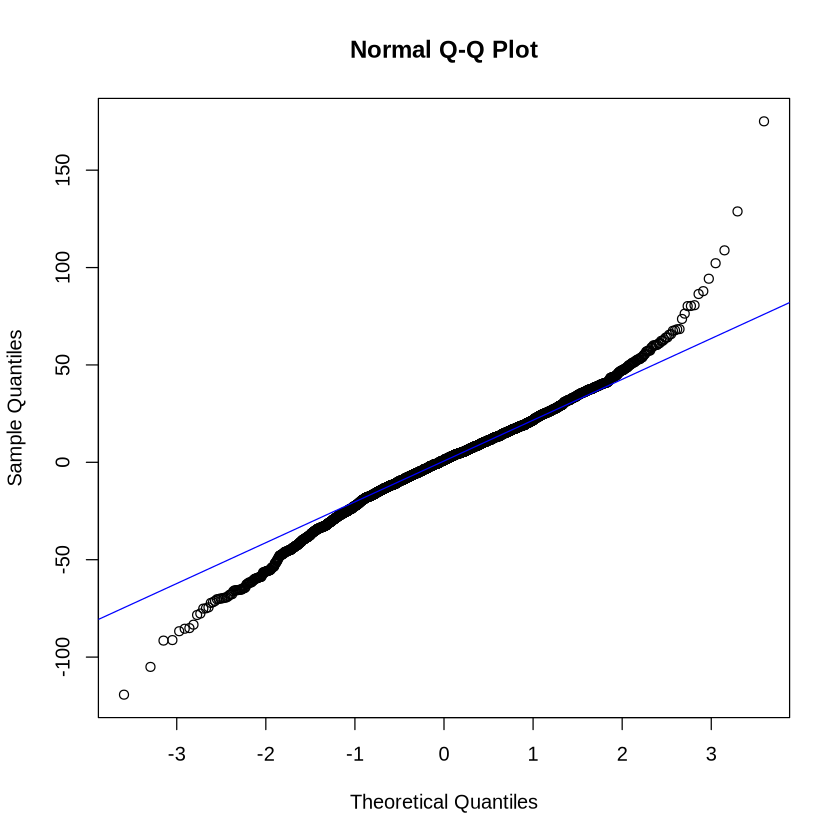

In [52]:
qqnorm(residuals)
qqline(residuals(base_model), col = "blue")

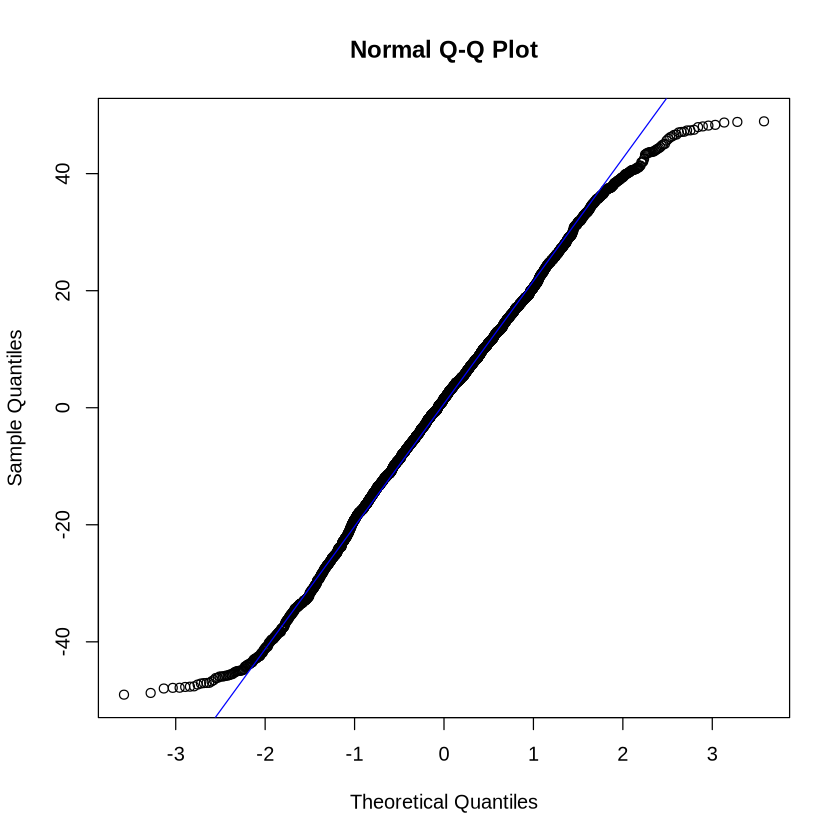

In [53]:
qqnorm(non_outliers)
qqline(residuals(base_model), col = "blue")

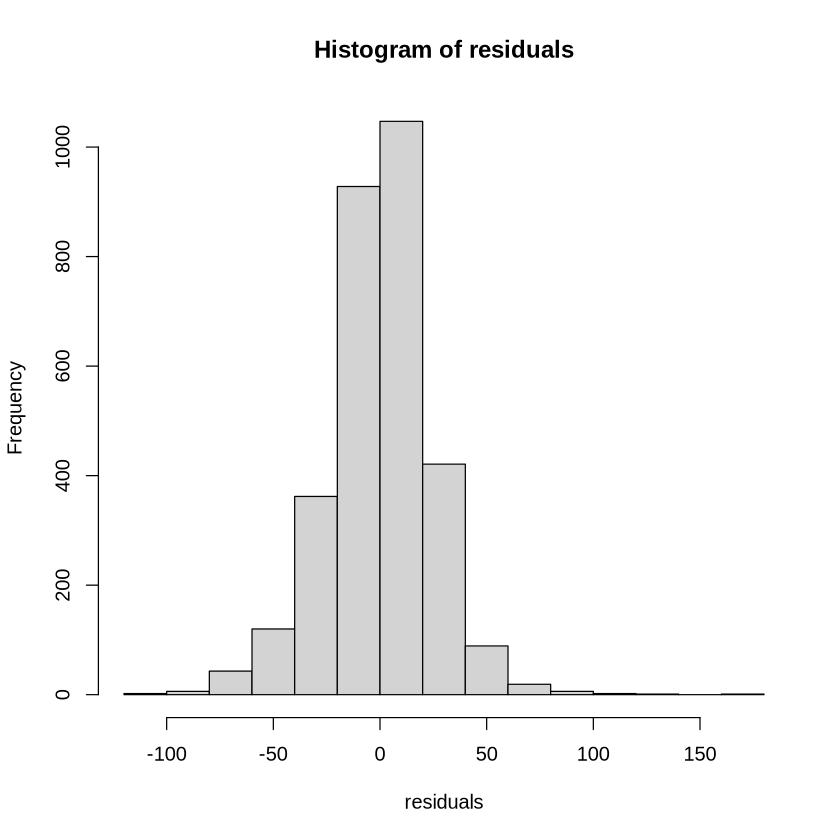

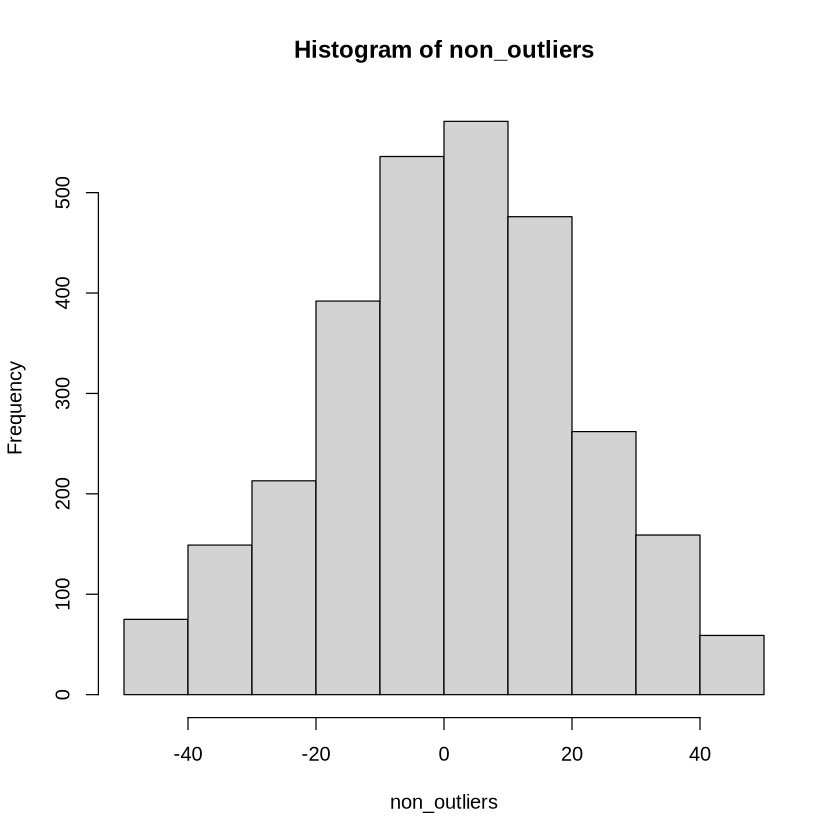

In [54]:
hist(residuals)
hist(non_outliers)

**Notes on outlier work**
By removing the residuals which were greater than 2 standard deviations away from 0, we are able to reduce how far the residuals are away from the qqline and reduce variation in our model. This is a good thing, as this suggests a good fit in our model

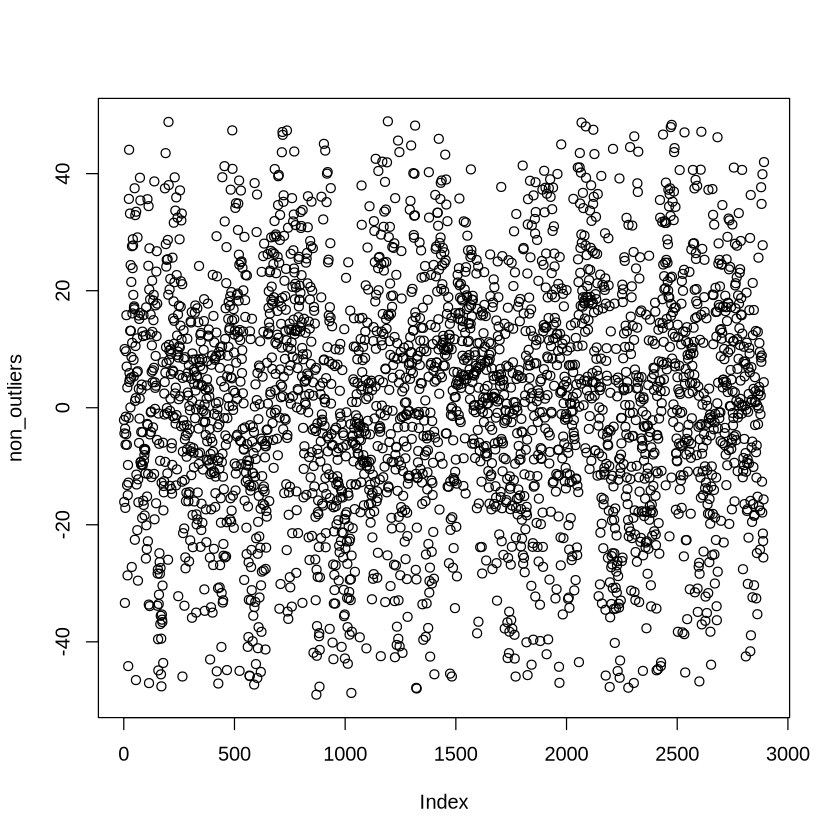

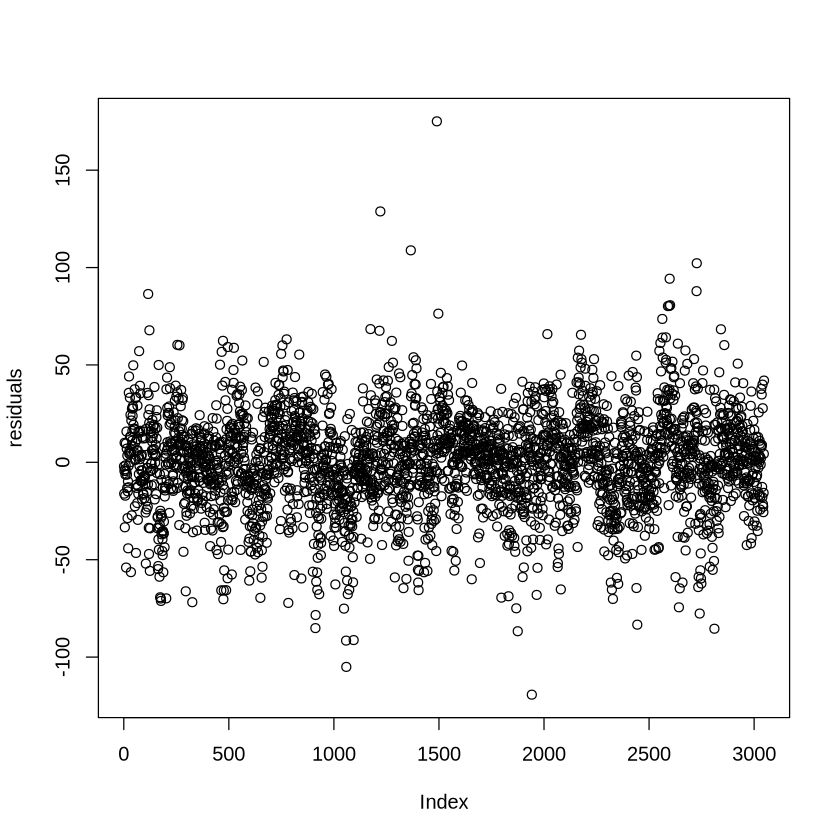

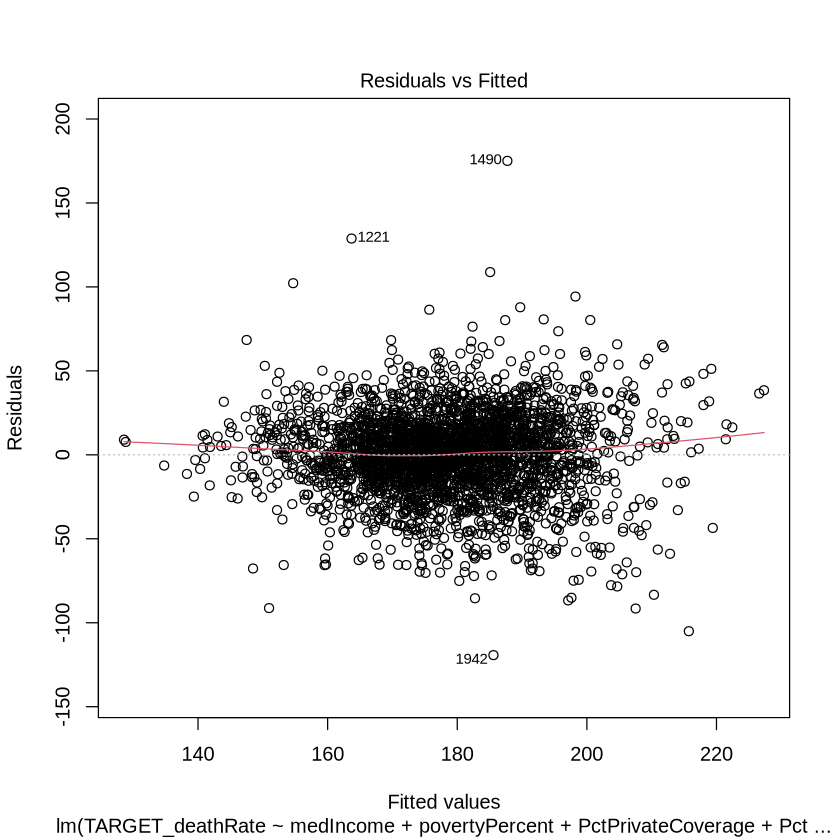

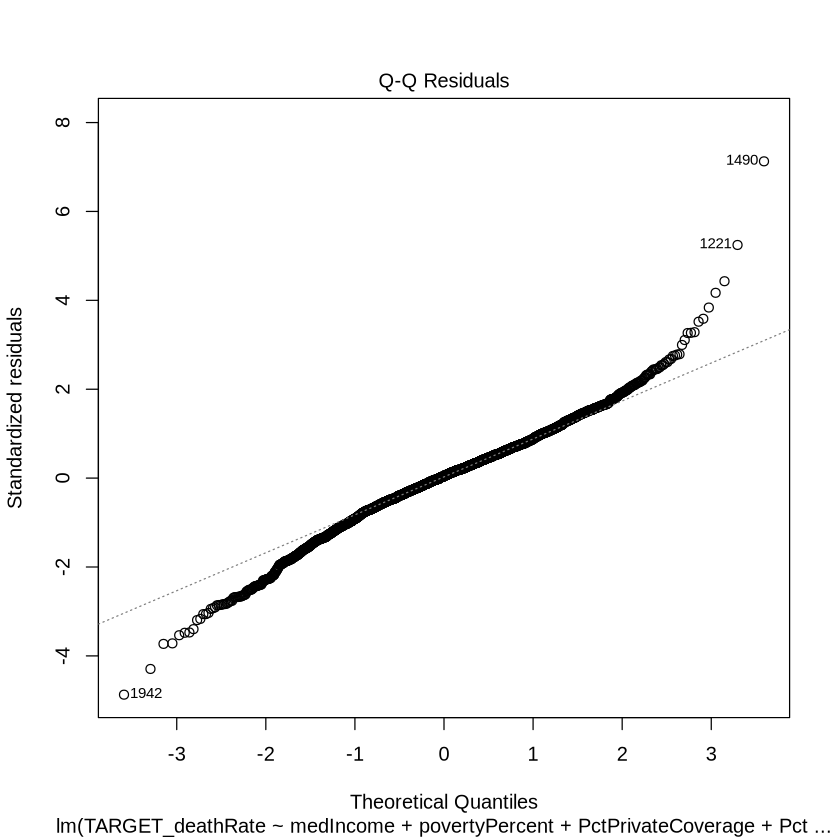

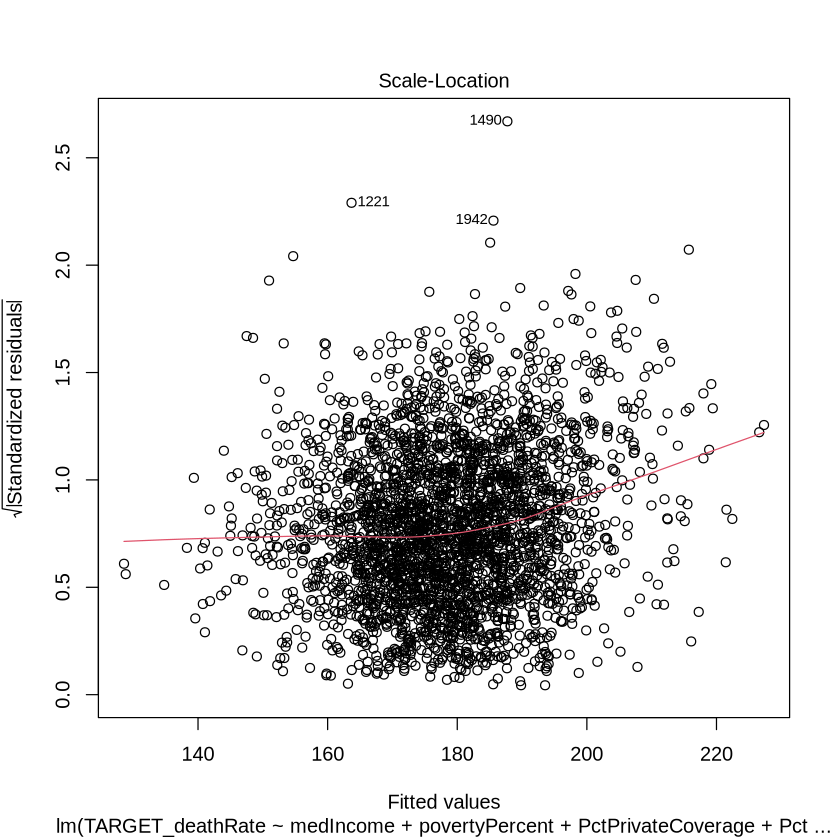

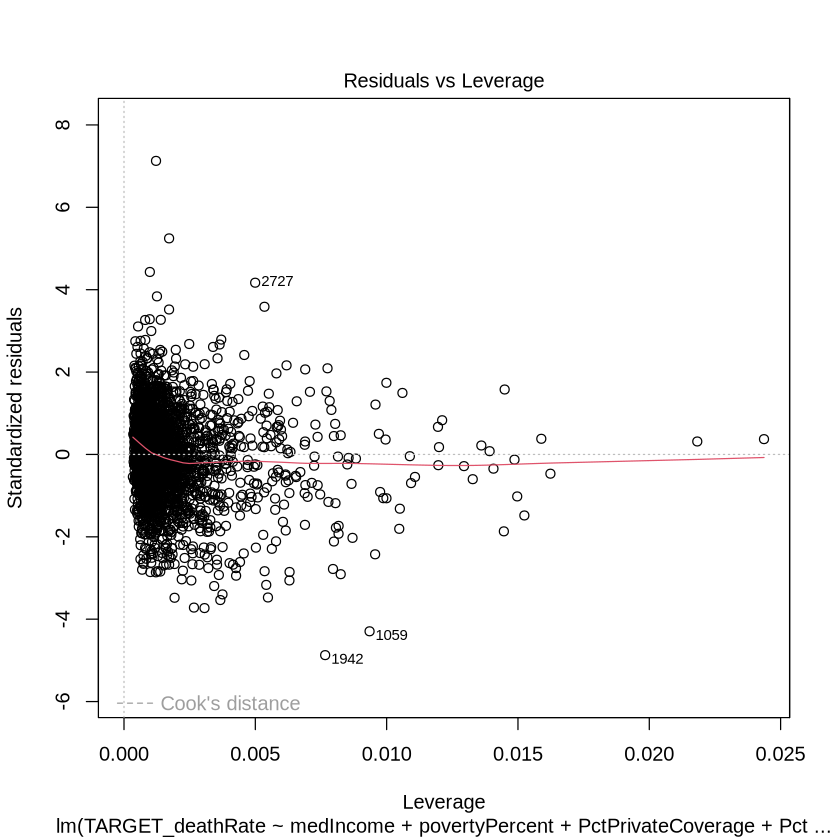

In [57]:
plot(non_outliers)
plot(residuals)
plot(base_model)

**NOTES**
PctPrivateCoverageAlone and PctPrivateCoverage are redundant, and one can be removed. PctPrivCoverage and PctEmpPrivCoverage are also redundant. povertypercent and medIncome have a strong negative correlation, so this must be noted in our discussion of variable choices. 

We are not doing a predictive model, so multicollinearity is not so much of an issue. This should be noted in our project discussion. 

In [74]:
model_spec_1 <- lm(TARGET_deathRate ~ medIncome + povertyPercent + medIncome*povertyPercent, cancer_data)
summary(model_spec_1)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent + 
    medIncome * povertyPercent, data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-125.789  -13.486    1.369   15.005  174.701 

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)    
(Intercept)               1.843e+02  4.572e+00  40.303  < 2e-16 ***
medIncome                -3.487e-04  7.598e-05  -4.589 4.63e-06 ***
povertyPercent            1.899e+00  2.270e-01   8.366  < 2e-16 ***
medIncome:povertyPercent -2.895e-05  6.673e-06  -4.338 1.49e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.67 on 3043 degrees of freedom
Multiple R-squared:  0.2106,	Adjusted R-squared:  0.2099 
F-statistic: 270.7 on 3 and 3043 DF,  p-value: < 2.2e-16


In [85]:
vif_spec_1 <- vif(model_spec_1, type = "predictor")
vif_spec_1

GVIFs computed for predictors



,GVIF,Df,GVIF^(1/(2*Df)),Interacts With,Other Predictors
,<dbl>,<dbl>,<dbl>,<chr>,<chr>
medIncome,1,3,1,povertyPercent,--
povertyPercent,1,3,1,medIncome,--


In [62]:
residuals_spec_1 <- residuals(model_spec_1)
mean_residuals_spec_1 <- mean(residuals_spec_1)
sd_residuals_spec_1 <- sd(residuals_spec_1)
outliers_spec_1 <- abs(residuals_spec_1 - mean_residuals_spec_1) >= 2*sd_residuals_spec_1
non_outliers_spec_1 <- residuals_spec_1[!outliers_spec_1]

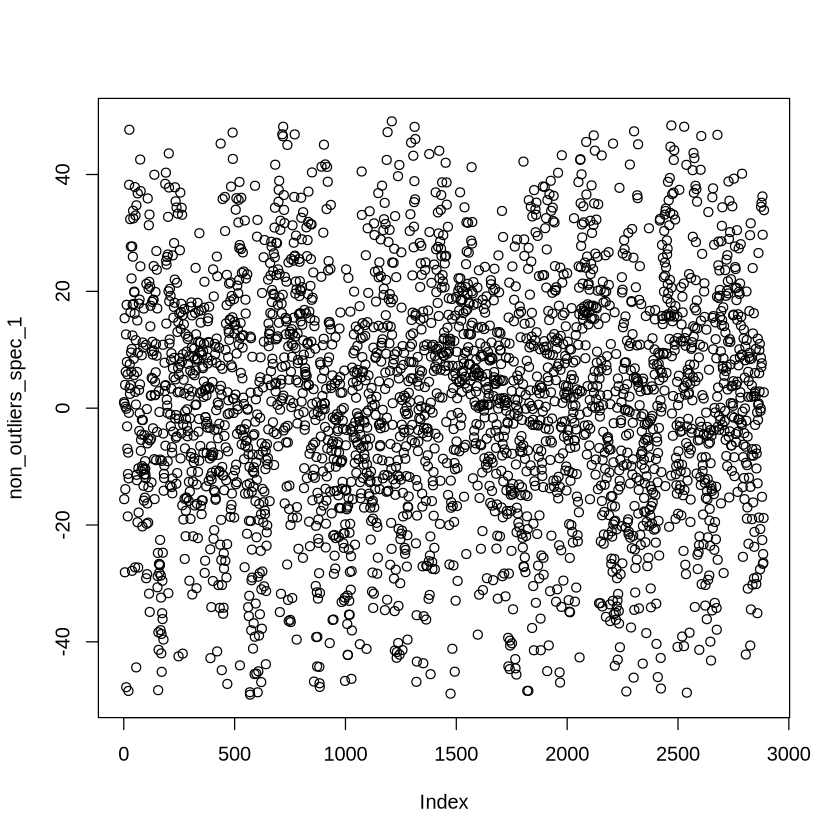

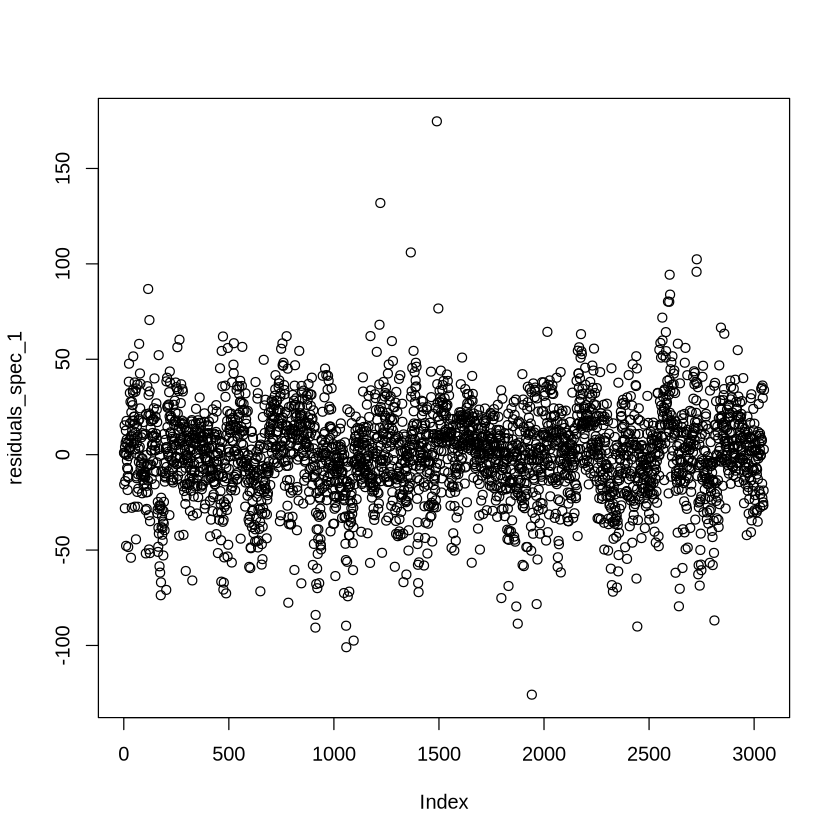

In [63]:
plot(non_outliers_spec_1)
plot(residuals_spec_1)

***BP TEST***

In [67]:
library(lmtest)
bptest(model_spec_1)


	studentized Breusch-Pagan test

data:  model_spec_1
BP = 89.894, df = 3, p-value < 2.2e-16


In [82]:
robust_se <- vcovHC(model_spec_1)
robust_se_results <- coeftest(model_spec_1, vcov = robust_se)
summary(robust_se)
summary(robust_se_results)

  (Intercept)          medIncome          povertyPercent      
 Min.   :-0.746861   Min.   :-3.019e-04   Min.   :-0.7468610  
 1st Qu.:-0.186942   1st Qu.:-7.547e-05   1st Qu.:-0.1867165  
 Median :-0.000149   Median : 2.590e-09   Median : 0.0000076  
 Mean   : 5.884663   Mean   :-7.125e-05   Mean   :-0.1689278  
 3rd Qu.: 6.071455   3rd Qu.: 4.227e-06   3rd Qu.: 0.0177963  
 Max.   :24.285812   Max.   : 1.689e-05   Max.   : 0.0711345  
 medIncome:povertyPercent
 Min.   :-1.673e-06      
 1st Qu.:-4.185e-07      
 Median :-1.360e-10      
 Mean   : 4.189e-07      
 3rd Qu.: 8.373e-07      
 Max.   : 3.349e-06      

    Estimate           Std. Error          t value          Pr(>|t|)        
 Min.   : -0.00035   Min.   :0.000007   Min.   :-4.701   Min.   :0.000e+00  
 1st Qu.: -0.00011   1st Qu.:0.000057   1st Qu.:-4.119   1st Qu.:0.000e+00  
 Median :  0.94952   Median :0.133392   Median : 1.598   Median :1.353e-06  
 Mean   : 46.53765   Mean   :1.298714   Mean   : 8.971   Mean   :2.285e-05  
 3rd Qu.: 47.48728   3rd Qu.:1.432049   3rd Qu.:14.687   3rd Qu.:2.420e-05  
 Max.   :184.25193   Max.   :4.928064   Max.   :37.388   Max.   :8.868e-05  

**NOTES**
by using robust standard errors, we see that the model is still valid despite the heteroskedasticity that was present in our data variables. the coefficients and p values are still significiant. 
p < 0.005, so all terms are significant. 

multicollinearity is accounted for and not having a large effect, as the robust standard errors are not large, suggesting it is not impacting the model severely. we will do VIF test to examine this. 

the fit of the model: the t and p values tell us the terms are statistically significant in their relationship with target variable. we should check r^2 and see what that is.

to include: BP test to examine if heteroskedasticity was present. VIF test, to see if we need to use PCA. check r^2 and adjusted r^2. 

question for TA. robust_se regression doesn't give us all the stats that regular regression does. How can I still get all those stats, like r^2 and f-values. or do those come from the original test unrelated to robuse_se regression?

also, what can I do with the normalized residuals that I did up above. Can I include them at all in our analysis? Does it tell us anything important?

when I test the above model for VIF, I get a GVIF = 1. does that mean there is no multicollinearity? Or all multicollinearity is accounted for by the interaction term? 

***NEW SPECIFICATION MODEL***
If you have public coverage for your whole life, it may have had an exponenetial impact on your health, since you had access to healthcare for a long period of time, which would have a greater impact on your health than someone who only had healthcare for certain periods during their life

In [88]:
model_spec_2 <- lm(TARGET_deathRate ~ medIncome + povertyPercent + log(PctPublicCoverage), data = cancer_data)
summary(model_spec_2)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent + 
    log(PctPublicCoverage), data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-121.016  -13.640    1.134   14.620  174.609 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             9.881e+01  1.362e+01   7.256 5.04e-13 ***
medIncome              -2.507e-04  7.421e-05  -3.379 0.000737 ***
povertyPercent          1.016e+00  1.131e-01   8.988  < 2e-16 ***
log(PctPublicCoverage)  2.090e+01  3.051e+00   6.850 8.91e-12 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.56 on 3043 degrees of freedom
Multiple R-squared:  0.2178,	Adjusted R-squared:  0.217 
F-statistic: 282.5 on 3 and 3043 DF,  p-value: < 2.2e-16


In [90]:
vif_spec_2 <- vif(model_spec_2)
vif_spec_2

medIncome         povertyPercent log(PctPublicCoverage) 
              4.032570               2.652761               2.505076

In [91]:
bptest(model_spec_2)


	studentized Breusch-Pagan test

data:  model_spec_2
BP = 83.978, df = 3, p-value < 2.2e-16


In [92]:
robust_se_2 <- vcovHC(model_spec_2)
robust_se_results_2 <- coeftest(model_spec_2, vcov = robust_se_2)
summary(robust_se_2)
summary(robust_se_results_2)

  (Intercept)         medIncome          povertyPercent     
 Min.   :-47.1507   Min.   :-8.916e-04   Min.   :-0.586961  
 1st Qu.:-12.2279   1st Qu.:-2.229e-04   1st Qu.:-0.155961  
 Median : -0.2939   Median : 3.328e-06   Median :-0.006144  
 Mean   : 43.1405   Mean   :-1.848e-04   Mean   :-0.144933  
 3rd Qu.: 55.0744   3rd Qu.: 4.145e-05   3rd Qu.: 0.004885  
 Max.   :220.3004   Max.   : 1.459e-04   Max.   : 0.019518  
 log(PctPublicCoverage)
 Min.   :-47.15066     
 1st Qu.:-11.79688     
 Median : -0.00607     
 Mean   : -8.95729     
 3rd Qu.:  2.83352     
 Max.   : 11.33364     

    Estimate          Std. Error           t value          Pr(>|t|)        
 Min.   :-0.00025   Min.   : 0.000074   Min.   :-3.380   Min.   :0.000e+00  
 1st Qu.: 0.76213   1st Qu.: 0.104800   1st Qu.: 3.811   1st Qu.:0.000e+00  
 Median :10.95660   Median : 1.753128   Median : 6.432   Median :3.000e-10  
 Mean   :30.18053   Mean   : 4.587213   Mean   : 4.190   Mean   :1.837e-04  
 3rd Qu.:40.37501   3rd Qu.: 6.235541   3rd Qu.: 6.811   3rd Qu.:1.837e-04  
 Max.   :98.80918   Max.   :14.842521   Max.   : 7.274   Max.   :7.349e-04  

***NOTES***
seems like we are addressing heteroskedasticity, and the robust se's. we can check r^2 to see how well the model explains the variance, and see if we can normalize the variance or anything like that

spec checks: do you understand what it means to test for multicollinearity and heteroskedasticity, if they do, your original spec was incorrect, and you must address your bad model by taking the results of the test then fixing it. for multicollinearittt, identify which casue, then remove it. or fix in another way.

heterskedasticity: include robust_se, hd1 errors into your original models

other tests are also allowed. you understand what a good model is, and you run through the tests.

robustness of the model:

check the robustness by looking at variations of it, then see if it suffers from biases or other issues <- how do we check this

add one variable or remove one, and if the results are drastically different, the one variable you chose to include or remove is very important, and if you remove it, you have OVB.

other option, transform into non-linear forms then see. if they dont't change much, our original model is already robust. or if it changes a lot, our original model did not account for non-linearity in the data. 

***Notes***
for any specifications we make, we want to cite other literature that has done the same. or anything we do, we want to cite anohter paper. in their research, they had a large interaction so they included one. so we do the same

In [102]:
matrix_data <- dplyr::select(cancer_data, medIncome, povertyPercent, PctPrivateCoverage, PctPublicCoverage)

In [103]:
matrix_data <- matrix_data |>
  mutate(across(everything(), as.numeric))

In [105]:
matrix <- cor(matrix_data)
matrix

,medIncome,povertyPercent,PctPrivateCoverage,PctPublicCoverage
medIncome,1.0000000,-0.7889652,0.7241748,-0.7548218
povertyPercent,-0.7889652,1.0000000,-0.8225343,0.6511621
PctPrivateCoverage,0.7241748,-0.8225343,1.0000000,-0.7200115
PctPublicCoverage,-0.7548218,0.6511621,-0.7200115,1.0000000


***notes***
the RESET test tests for OVB. how do we go about testing for which variable it is? is it the one with the highest multicollinearity? 

***Specification model, including interaction term between povertypercent and percent private coverage. There is a negative correlation, meaning that the higher the percentage of poverty, the less likely someone is to have private coverage.***

In [112]:
int_model <- lm(TARGET_deathRate ~ medIncome + povertyPercent + PctPublicCoverage + povertyPercent*PctPublicCoverage,
                data = cancer_data)
summary(int_model)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent + 
    PctPublicCoverage + povertyPercent * PctPublicCoverage, data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-120.573  -13.300    1.367   14.690  177.673 

Coefficients:
                                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       1.981e+02  1.091e+01  18.149  < 2e-16 ***
medIncome                        -5.124e-04  8.208e-05  -6.243 4.90e-10 ***
povertyPercent                   -8.221e-01  3.948e-01  -2.082   0.0374 *  
PctPublicCoverage                -1.948e-01  1.849e-01  -1.054   0.2920    
povertyPercent:PctPublicCoverage  3.977e-02  8.515e-03   4.671 3.12e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.49 on 3042 degrees of freedom
Multiple R-squared:  0.2222,	Adjusted R-squared:  0.2211 
F-statistic: 217.2 on 4 and 3042 DF,  p-value: < 2.2e-16


our individual terms are now less significant? 

In [113]:
check_model <- lm(TARGET_deathRate ~ medIncome + povertyPercent*PctPublicCoverage,
                data = cancer_data)
summary(check_model)


Call:
lm(formula = TARGET_deathRate ~ medIncome + povertyPercent * 
    PctPublicCoverage, data = cancer_data)

Residuals:
     Min       1Q   Median       3Q      Max 
-120.573  -13.300    1.367   14.690  177.673 

Coefficients:
                                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       1.981e+02  1.091e+01  18.149  < 2e-16 ***
medIncome                        -5.124e-04  8.208e-05  -6.243 4.90e-10 ***
povertyPercent                   -8.221e-01  3.948e-01  -2.082   0.0374 *  
PctPublicCoverage                -1.948e-01  1.849e-01  -1.054   0.2920    
povertyPercent:PctPublicCoverage  3.977e-02  8.515e-03   4.671 3.12e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 24.49 on 3042 degrees of freedom
Multiple R-squared:  0.2222,	Adjusted R-squared:  0.2211 
F-statistic: 217.2 on 4 and 3042 DF,  p-value: < 2.2e-16
